In [15]:
#Import of libraries
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

In [16]:
# DEBUG: Test version
print(nx.__version__)

2.7.1


----
# 1. Define setup 
In this part, we define the variables used for controlling the application. By doing this, we are trying to make sure that we don't have to modify the rest of the code.

In [112]:
# Define for which euclidian distances (in meters) the near-repeat networks should be created
proximity_distance = [
    200,
    300,
    400
]

# Define for which period (in days) the near-repeat networks should be created
proximity_time = [
    14
]

# Define which types of crimes should be analysed
crime_groups = [
    'burglary_residence',
    'burglary_business'
]

# A list of network properties we want to investigate
list_network_properties_headers = [
    'centrality',
    'centrality_degree',
    'centrality_eigenvector',
    'centrality_closeness',
    'centrality_betweenness',
    'clustering_coefficient',
    'assortativity'
]

# dict used to store a nx graph for each dimension
dict_graph = {}

PATH_TO_DATA = '../assets/data/prepared/denver_prepared.csv'  # Change if needed


# Setup for networks
nodesize = 75
width = 1
figsize_width = 40
figsize_height = 30
label = False
fontsize = 45

----
# 2. Data import
Load the data set, that was prepared in '1_data_prep'

In [18]:
df = pd.read_csv(PATH_TO_DATA, delimiter=',')
df.head(5)

,id,crime_type,crime_cat,district,precinct,neighborhood,timestamp,long,lat,crime,...,day14_300m,day14_300m_mintindex,day14_300m_mintindex_mentions,day14_300m_mintdate,day14_300m_mintdatediff,day14_400m,day14_400m_mintindex,day14_400m_mintindex_mentions,day14_400m_mintdate,day14_400m_mintdatediff
0,20162874,burglary-business-by-force,burglary,2,222,montclair,2016-01-02 05:00:00,-104.914776,39.737851,burglary_business,...,0,0,0,NaN,0,0,0,0,NaN,0
1,20166879,burglary-residence-no-force,burglary,3,322,washington-virginia-vale,2016-01-02 08:35:00,-104.909504,39.691124,burglary_residence,...,0,0,0,NaN,0,0,0,0,NaN,0
2,20163184,burglary-business-by-force,burglary,6,611,cbd,2016-01-02 13:38:00,-104.995367,39.741134,burglary_business,...,0,0,0,NaN,0,0,0,0,NaN,0
3,20164917,burglary-residence-by-force,burglary,3,322,virginia-village,2016-01-02 17:00:00,-104.904795,39.681983,burglary_residence,...,0,0,0,NaN,0,0,0,0,NaN,0
4,20163610,burglary-residence-by-force,burglary,3,321,hilltop,2016-01-02 17:55:00,-104.928957,39.720677,burglary_residence,...,0,0,0,NaN,0,0,0,0,NaN,0


In [73]:
df.tail(5)

,id,crime_type,crime_cat,district,precinct,neighborhood,timestamp,long,lat,crime,...,day14_300m,day14_300m_mintindex,day14_300m_mintindex_mentions,day14_300m_mintdate,day14_300m_mintdatediff,day14_400m,day14_400m_mintindex,day14_400m_mintindex_mentions,day14_400m_mintdate,day14_400m_mintdatediff
23619,2021231406,burglary-business-by-force,burglary,4,422,ruby-hill,2021-04-24 22:00:00,-105.019793,39.685614,burglary_business,...,0,0,0,NaN,0,0,0,0,NaN,0
23620,2021232129,burglary-residence-no-force,burglary,4,423,marston,2021-04-25 00:00:00,-105.084098,39.629311,burglary_residence,...,0,0,0,NaN,0,0,0,0,NaN,0
23621,2021232356,burglary-residence-no-force,burglary,1,121,jefferson-park,2021-04-25 01:30:00,-105.020146,39.757111,burglary_residence,...,0,0,0,NaN,0,0,0,0,NaN,0
23622,2021232863,burglary-residence-by-force,burglary,2,213,congress-park,2021-04-25 15:00:00,-104.949703,39.738585,burglary_residence,...,0,0,0,NaN,0,0,0,0,NaN,0
23623,2021233631,burglary-business-no-force,burglary,2,211,five-points,2021-04-25 22:10:00,-104.980836,39.761880,burglary_business,...,0,0,0,NaN,0,1,2021228288,0,2021-04-22 12:00:00,3


In [76]:
df.equals(df.sort_values(by=['timestamp']))

False

In [19]:
abc = df.drop_duplicates(subset='id')
print(len(df))
print(len(abc))

23624
23624


In [21]:
df['crime'].value_counts()

burglary_residence    15394
burglary_business      7852
burglary_other          378
Name: crime, dtype: int64

----
# 4. Create network models
TODO: description

In [133]:
def draw_network(df_a, distance, crime):
    G = nx.Graph()
    
    for index, row in df_a.loc[df_a[f'day14_{distance}m_mintindex'] > 0].iterrows():
        index_row = row['id']
        mintindex_row = row[f'day14_{distance}m_mintindex']
        
        G.add_edge(index_row, mintindex_row)

    dict_graph[f'{crime}_14d_{distance}m'] = G

    fig = plt.figure(1, figsize=(figsize_width*1.5, figsize_height*1.5), dpi=75)
    fig.suptitle((f'Visualization of {crime} near-repeats within {distance}m and 14 days of initial offense (n = {G.number_of_nodes()})'), fontsize=50, y=1.1, ha="center")
    
    nx.draw(G, with_labels=label, node_size=nodesize, width=width)
    plt.show()

## 4.1. Create network for both crime types and all distances

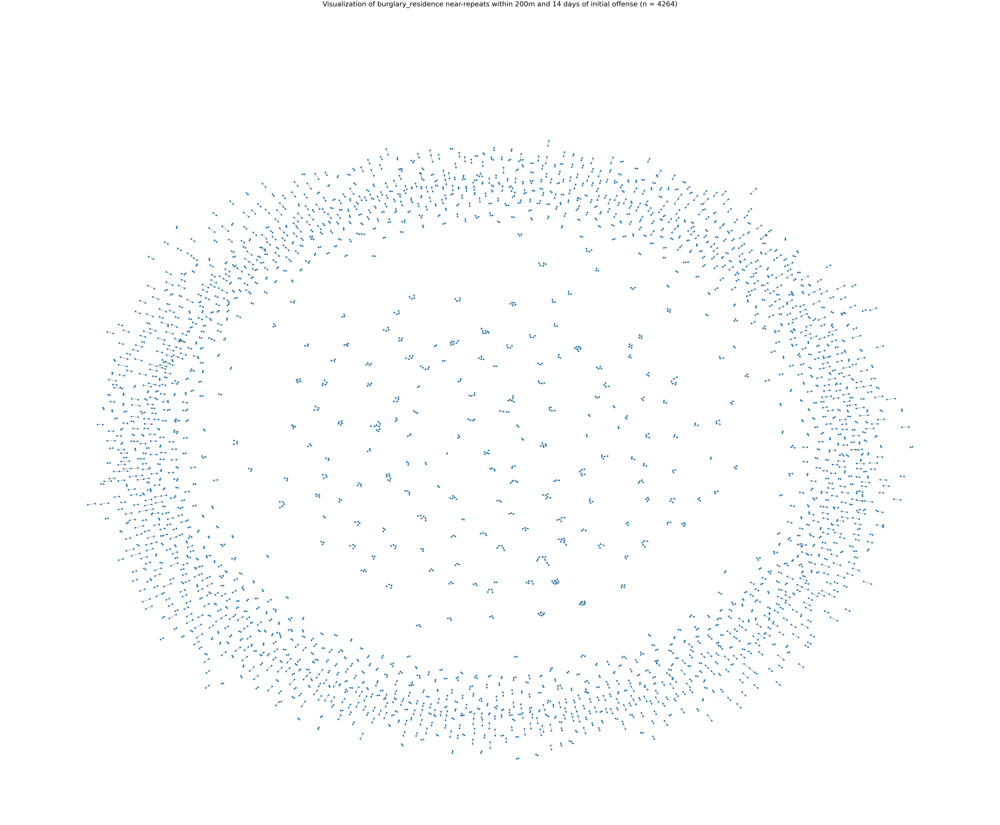

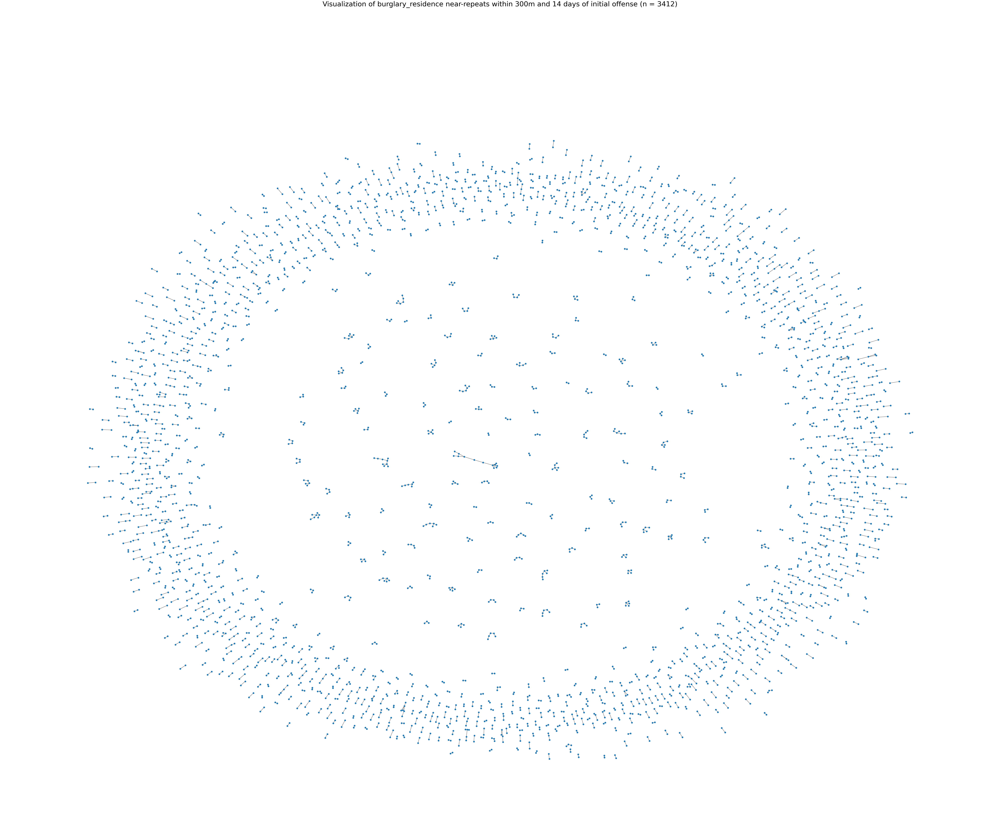

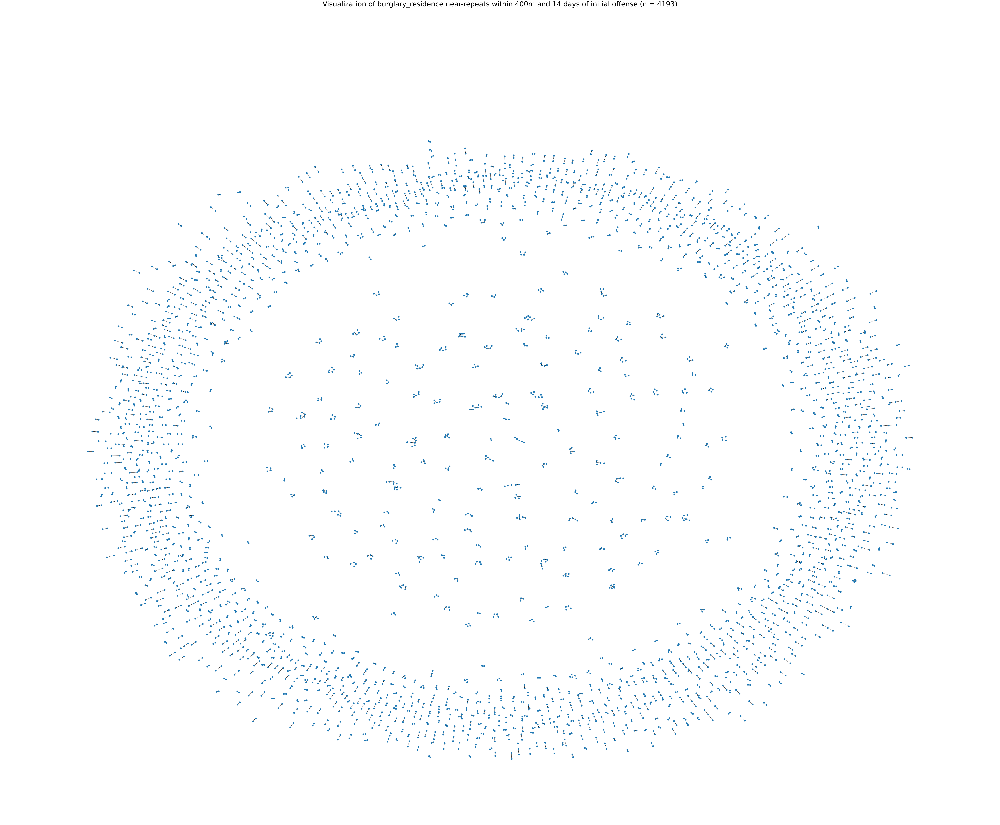

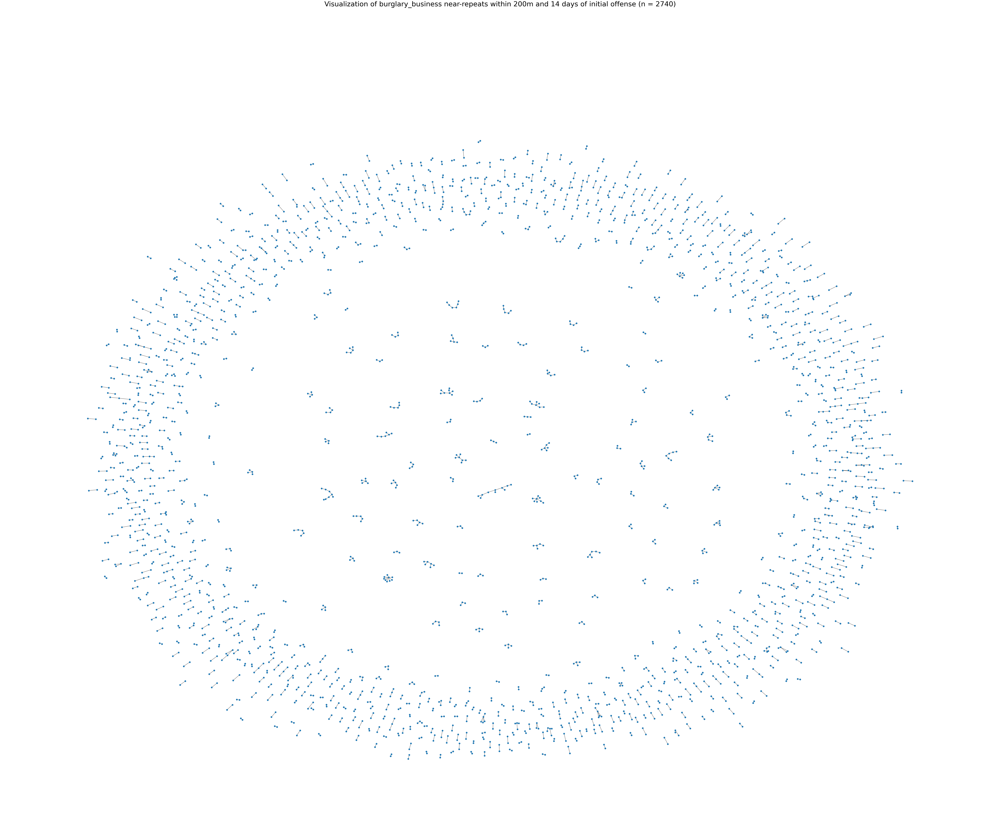

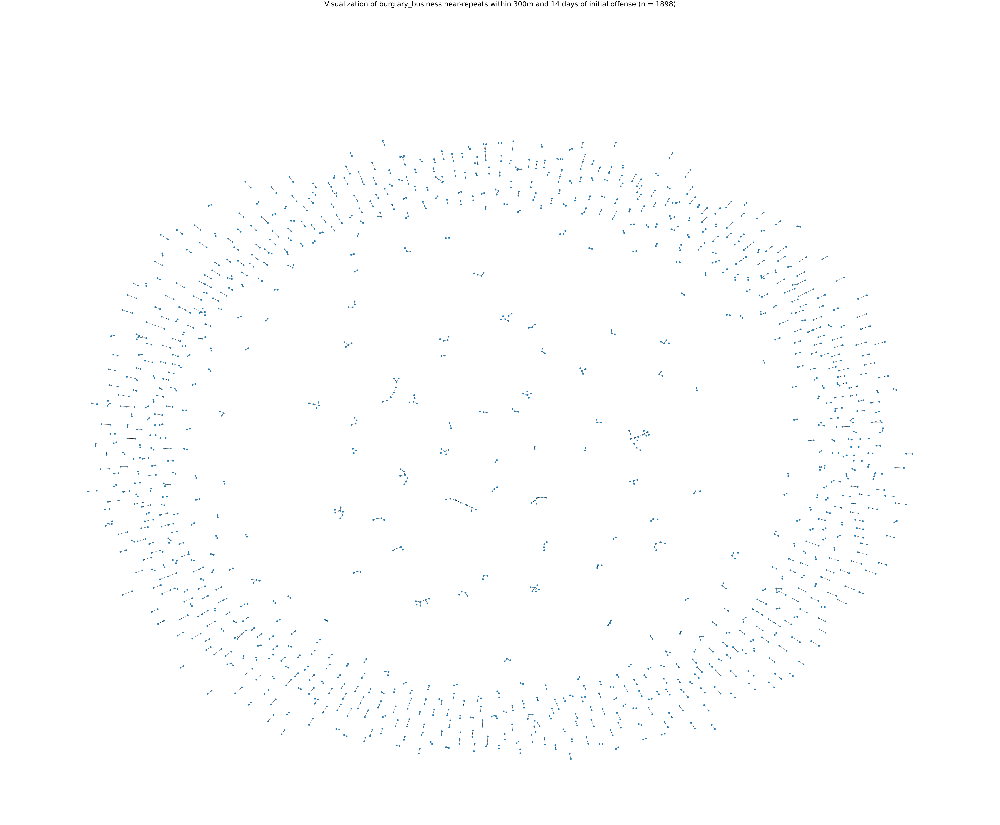

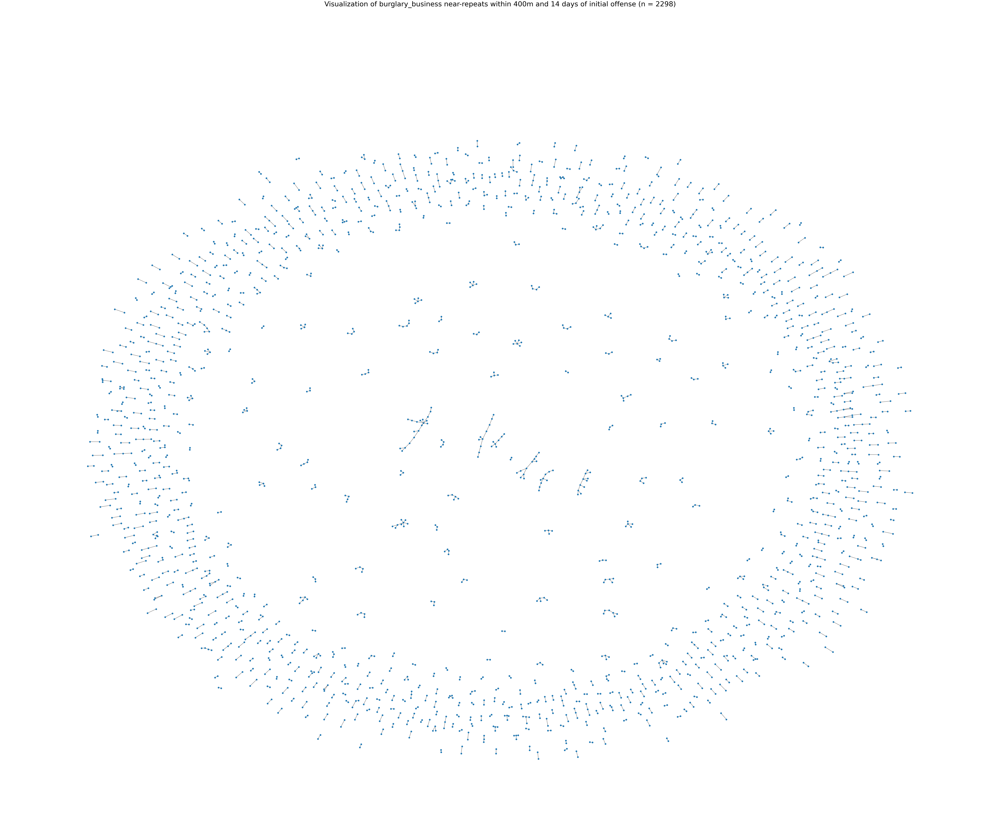

In [131]:
for crime in crime_groups:
    for distance in proximity_distance:
        df_in = df.loc[df['crime'] == crime]
        draw_network(df_in, distance, crime)           

## 4.2. Create network for all offenses

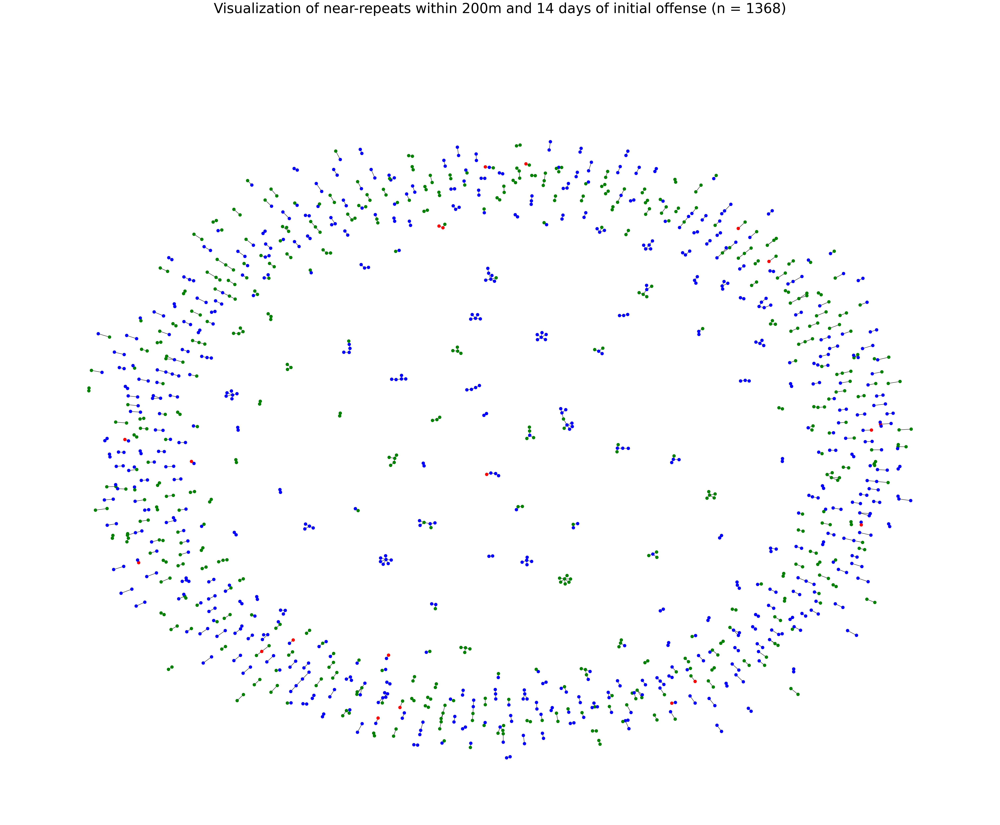

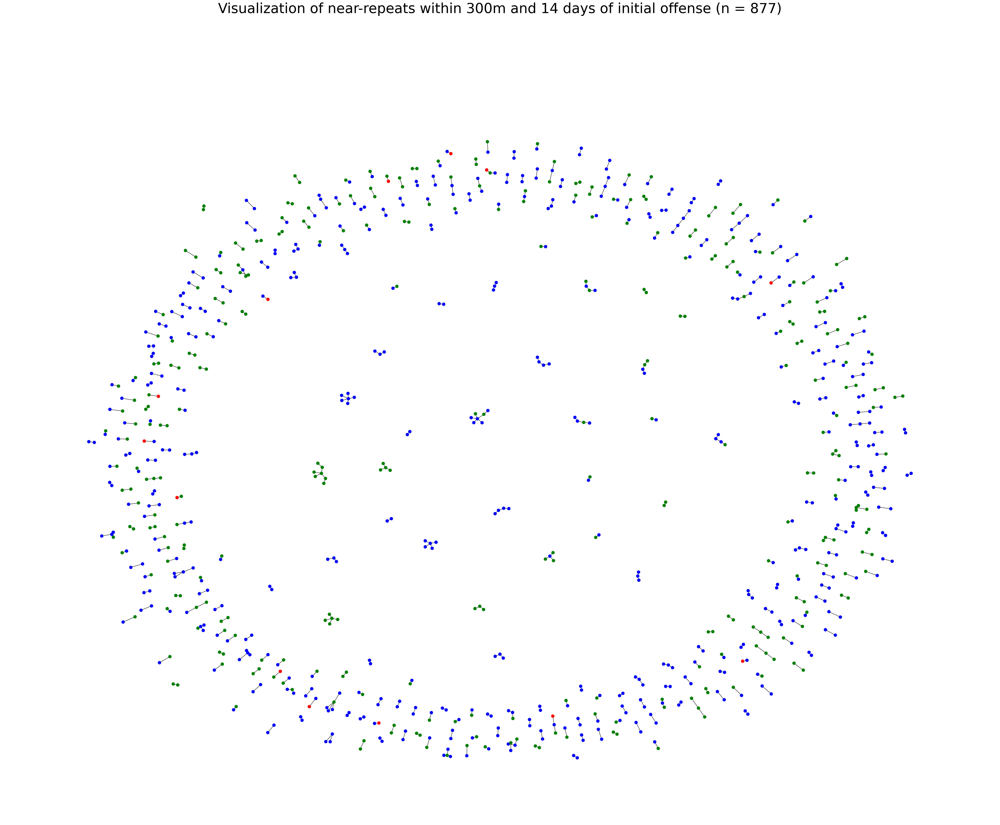

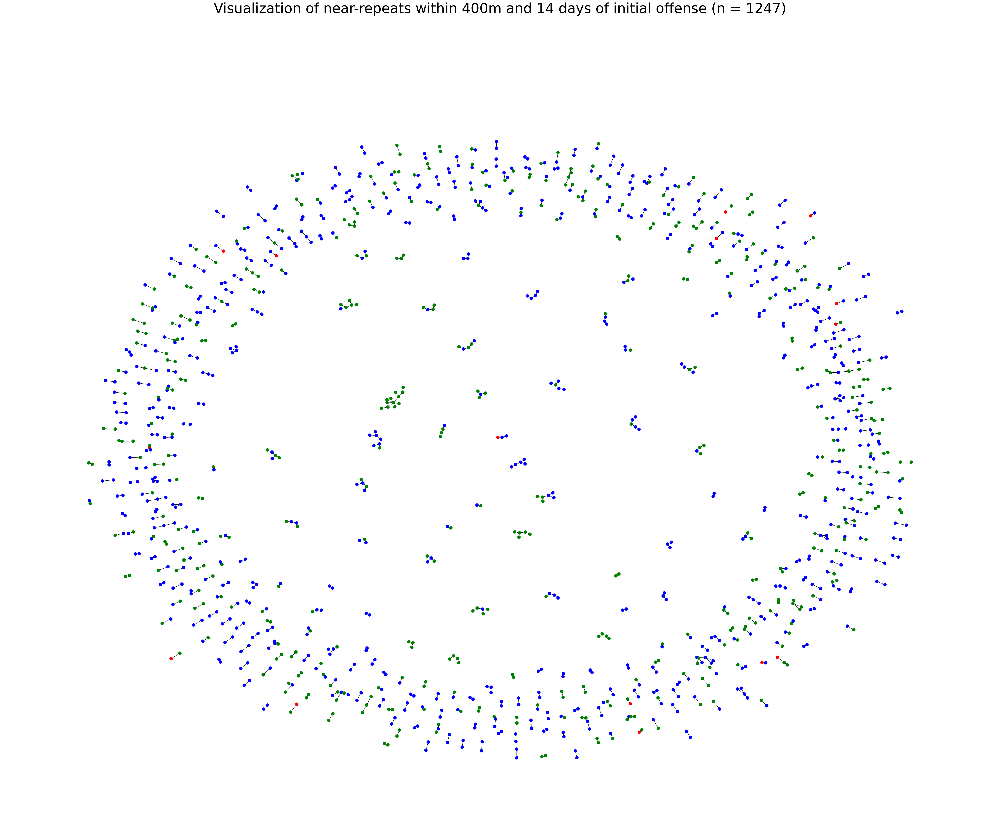

In [25]:
for distance in proximity_distance:
    G2 = nx.Graph()
    color_map = []

    for index, row in df.loc[df[f'day14_{distance}m'] >= 2].iterrows():
        index_row = row['id']
        G2.add_node(index_row)   

        mintindex_row = row[f'day14_{distance}m_mintindex']
        if mintindex_row:
            G2.add_edge(index_row, mintindex_row)

    for node in G2:
        temp = df.loc[df['id'] == node].crime.values[0]
        if temp == 'burglary_residence':
            color_map.append('blue')
        elif temp == 'burglary_business': 
            color_map.append('green')
        else:
            color_map.append('red')

    fig = plt.figure(1, figsize=(figsize_width, figsize_height), dpi=150)
    fig.suptitle((f'Visualization of near-repeats within {distance}m and 14 days of initial offense (n = {G2.number_of_nodes()})'), fontsize=40, y=1.1, ha="center")

    nx.draw(G2, with_labels=label, node_size=nodesize, width=width, node_color=color_map)
    plt.show()

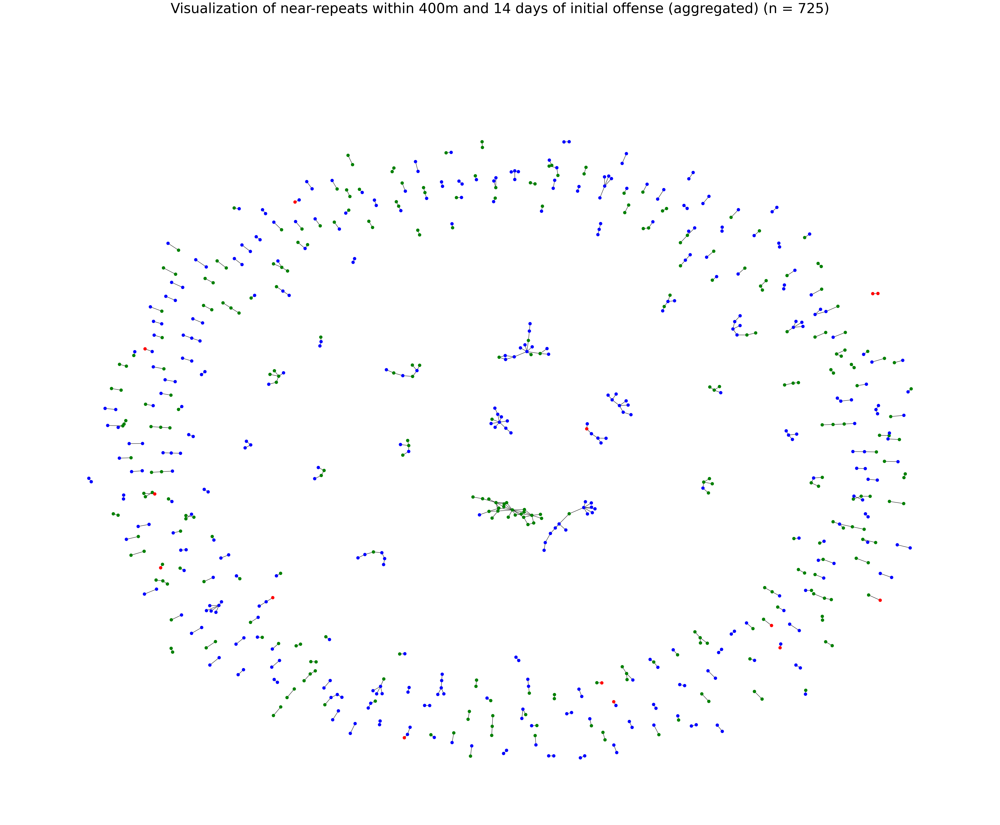

Time 4.395275115966797s


In [26]:
import time
start = time.time()

G3 = nx.Graph()
color_map_2 = []
for distance in proximity_distance:

    for index, row in df.loc[df[f'day14_{distance}m'] >= 3].iterrows():
        index_row = row['id']
        G3.add_node(index_row)   

        mintindex_row = False
        mintindex_row = row[f'day14_{distance}m_mintindex']
        if mintindex_row:
            G3.add_edge(mintindex_row, index_row)

for node in G3:
    temp = df.loc[df['id'] == node].crime.values[0]
    if temp == 'burglary_residence':
        color_map_2.append('blue')
    elif temp == 'burglary_business': 
        color_map_2.append('green')
    else:
        color_map_2.append('red')

fig = plt.figure(1, figsize=(figsize_width, figsize_height), dpi=150)
fig.suptitle((f'Visualization of near-repeats within 400m and 14 days of initial offense (aggregated) (n = {G3.number_of_nodes()})'), fontsize=40, y=1.1, ha="center")

nx.draw(G3, with_labels=label, node_size=nodesize, width=width, node_color=color_map_2)
plt.show()

end =  time.time()
print(f'Time {end - start}s')

429
201612527, burglary_business
201662949, burglary_business
201686095, burglary_residence
201686474, burglary_residence
2016107593, burglary_other
2016133716, burglary_residence
2016192032, burglary_business
2016162295, burglary_residence
2016166839, burglary_business
2016206025, burglary_business
2016185013, burglary_residence
2016207678, burglary_business
2016501289, burglary_business
2016581139, burglary_residence
2016539839, burglary_business
2016539463, burglary_business
2016510956, burglary_residence
2016578614, burglary_business
2016669966, burglary_business
2016576644, burglary_business
2016590619, burglary_business
2016649736, burglary_residence
2016806197, burglary_residence
201736620, burglary_residence
2017133695, burglary_business
2017191349, burglary_residence
2017201413, burglary_residence
2017208637, burglary_residence
2017227426, burglary_business
2017362669, burglary_residence
2017367039, burglary_residence
2017364079, burglary_residence
2017388056, burglary_residen

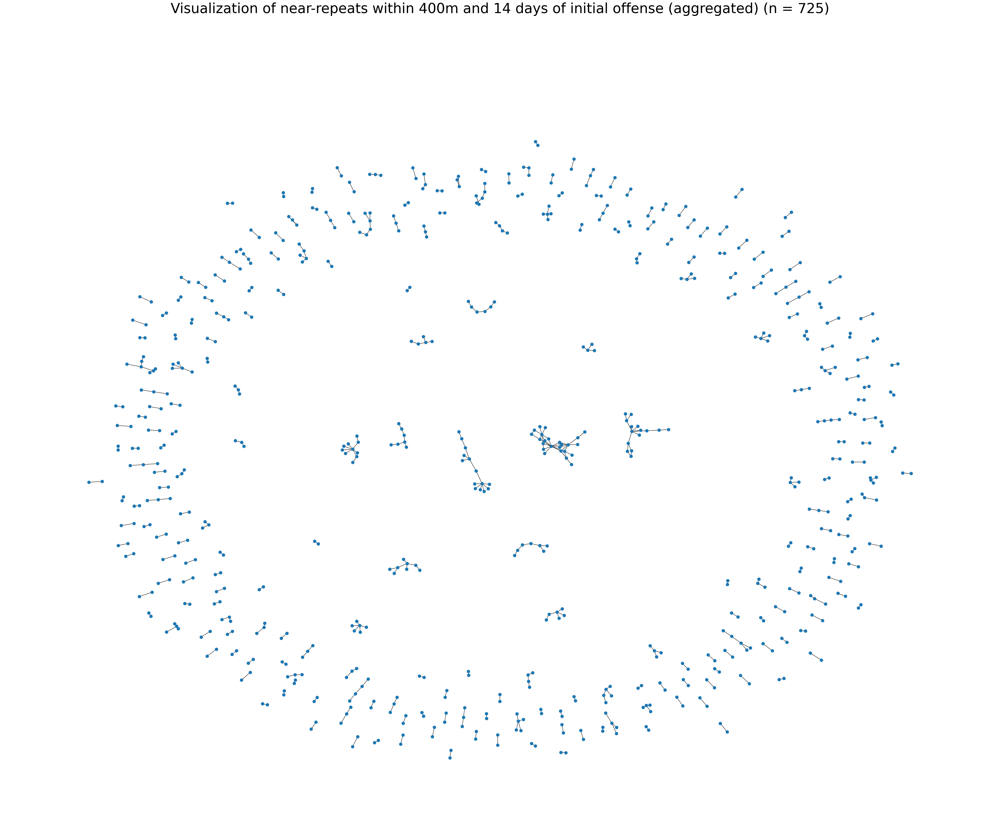

Time 4.314500093460083s
NODE 725
Counter: 460


In [52]:
import time
start = time.time()
counter = 0


G3 = nx.Graph()
for distance in proximity_distance:
    for index, row in df.loc[df[f'day14_{distance}m'] >= 3].iterrows():
        index_row = row['id']
        crime = row['crime']
        
        counter += 1
        
        G3.add_node(index_row, crime=crime)   

        mintindex_row = False
        mintindex_row = row[f'day14_{distance}m_mintindex']
        if mintindex_row:
            G3.add_edge(index_row, mintindex_row)
    
print(len(nx.get_node_attributes(G3, 'crime')))
for x, y in nx.get_node_attributes(G3, 'crime').items():
    print(f'{x}, {y}')
    if y == 'burglary_residence':
        color_map_2.append('blue')
    elif y == 'burglary_business': 
        color_map_2.append('green')
    else:
        color_map_2.append('red')
    
fig = plt.figure(1, figsize=(figsize_width, figsize_height), dpi=150)
fig.suptitle((f'Visualization of near-repeats within 400m and 14 days of initial offense (aggregated) (n = {G3.number_of_nodes()})'), fontsize=40, y=1.1, ha="center")

nx.draw(G3, with_labels=label, node_size=nodesize, width=width)
# nx.draw(G3, with_labels=label, node_size=nodesize, width=width, node_color=color_map_2)
plt.show()

end =  time.time()
print(f'Time {end - start}s')
print(f'NODE {G3.number_of_nodes()}')
print(f'Counter: {counter}')

23624
16131
Map: 0


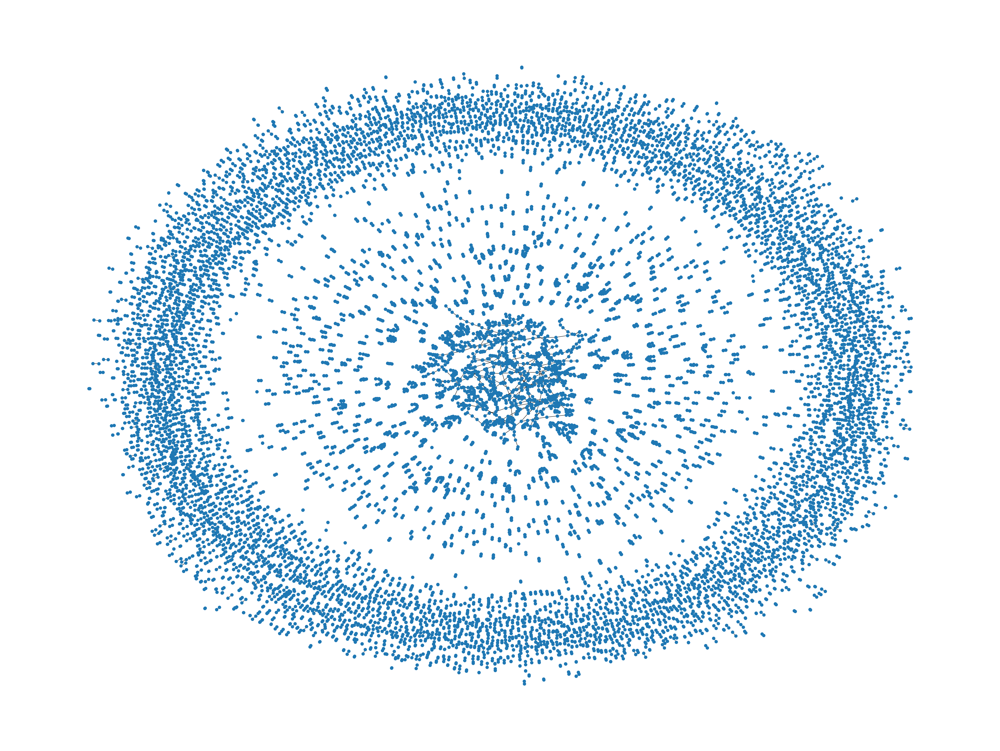

Time: 543.801647901535s


In [72]:
import time
start = time.time()

G5 = nx.Graph()
color_map = []

for index, row in df.iterrows():
    row_id = row['id']
    row_crime = row['crime']
    
    G5.add_node(row_id, crime=row_crime)

print(G5.number_of_nodes())
    
for distance in proximity_distance:
    for index, row in df.loc[df[f'day14_{distance}m'] >= 1].iterrows():
        mintindex_row = row[f'day14_{distance}m_mintindex']
        G5.add_edge(index, mintindex_row)

G5.remove_nodes_from(list(nx.isolates(G5)))
print(G5.number_of_nodes())
        
print(f'Map: {len(color_map)}')
        
fig = plt.figure(1, figsize=(figsize_width*2, figsize_height*2), dpi=75)
nx.draw(G5, with_labels=label, node_size=nodesize, width=width)
plt.show()
    
end =  time.time()
print(f'Time: {end - start}s')

----
# 5. Network properties
TODO: description

In [60]:
# create dataframe for output of network properties
index_tuple_list = []

for crime in crime_groups:
    for time in proximity_time:
        for distance in proximity_distance:
            index_tuples = (crime, time, distance)
            index_tuple_list.append(index_tuples)
            

print(index_tuple_list)

index = pd.MultiIndex.from_tuples(index_tuple_list)
df_np = pd.DataFrame(columns=list_network_properties_headers, index=index)
df_np

[('burglary_business', 14, 200), ('burglary_business', 14, 300), ('burglary_business', 14, 400), ('burglary_residence', 14, 200), ('burglary_residence', 14, 300), ('burglary_residence', 14, 400)]


centrality centrality_degree centrality_eigenvector  \
burglary_business  14 200        NaN               NaN                    NaN   
                      300        NaN               NaN                    NaN   
                      400        NaN               NaN                    NaN   
burglary_residence 14 200        NaN               NaN                    NaN   
                      300        NaN               NaN                    NaN   
                      400        NaN               NaN                    NaN   

                          centrality_closeness centrality_betweenness  \
burglary_business  14 200                  NaN                    NaN   
                      300                  NaN                    NaN   
                      400                  NaN                    NaN   
burglary_residence 14 200                  NaN                    NaN   
                      300                  NaN                    NaN   
                      400                  NaN                    NaN   

                          clustering_coefficient assortativity  
burglary_business  14 200                    NaN           NaN  
                      300                    NaN           NaN  
                      400                    NaN           NaN  
burglary_residence 14 200                    NaN           NaN  
                      300                    NaN           NaN  
                      400                    NaN           NaN

In [43]:
df_np.loc[('burglary_business', 14, 200)]['centrality'] = 5

In [61]:
def calc_network_prop(index, graph):
    print(f'index tup: {index}')
    df_temp = df_np.loc[(index)]
    df_temp['centrality_degree'] = nx.degree_centrality(graph)
    df_temp['centrality_eigenvector'] = nx.eigenvector_centrality(graph)

In [ ]:
    df_temp['centrality_eigenvector'] = nx.eigenvector_centrality(graph)
    df_temp['centrality_closeness'] = nx.closeness_centrality(graph)
    df_temp['centrality_betweenness'] = nx.betweenness_centrality(graph)
    df_temp['clustering_coefficient'] = nx.clustering(graph)
    df_temp['assortativity'] = nx.degree_assortativity_coefficient(graph)

In [62]:
for crime in crime_groups:
    for time in proximity_time:
        for distance in proximity_distance:
            index_tuple = (crime, time, distance)
            print(f'Temp: {index_tuple}')
            calc_network_prop(index_tuple, dict_graph[f'{crime}_14d_{distance}m'])

Temp: ('burglary_business', 14, 200)
index tup: ('burglary_business', 14, 200)
Temp: ('burglary_business', 14, 300)
index tup: ('burglary_business', 14, 300)


PowerIterationFailedConvergence: (PowerIterationFailedConvergence(...), 'power iteration failed to converge within 100 iterations')

## TEST: Highlight single node by highest value of property

In [135]:
abc = nx.eigenvector_centrality(dict_graph[f'burglary_business_14d_200m'])

In [136]:
abc

{20168813: 1.3733915560900655e-08,
 20168963: 2.378783953834075e-08,
 20168722: 1.3733915560900655e-08,
 201612527: 1.3733915560900655e-08,
 201617304: 2.937361698481868e-15,
 201613255: 2.937361698481868e-15,
 201626012: 3.0652973034470893e-11,
 201640513: 4.334985019240551e-11,
 201625468: 2.937361698481868e-15,
 201623676: 2.937361698481868e-15,
 201632070: 2.937361698481868e-15,
 20168307: 2.937361698481868e-15,
 201635815: 3.0652973034470893e-11,
 201647022: 2.937361698481868e-15,
 201625777: 2.937361698481868e-15,
 201651695: 2.937361698481868e-15,
 201627577: 2.937361698481868e-15,
 201657161: 2.937361698481868e-15,
 2016129309: 2.937361698481868e-15,
 201662949: 2.937361698481868e-15,
 201643576: 2.937361698481868e-15,
 201665053: 2.937361698481868e-15,
 201652960: 2.937361698481868e-15,
 201666694: 2.937361698481868e-15,
 201644824: 2.937361698481868e-15,
 201669044: 4.334985019240551e-11,
 201654684: 3.0652973034470893e-11,
 201670386: 2.937361698481868e-15,
 201670478: 2.937

In [137]:
len(abc)

2740

In [143]:
for x, y in abc.items():
    print(f'{x}, {y}')

20168813, 1.3733915560900655e-08
20168963, 2.378783953834075e-08
20168722, 1.3733915560900655e-08
201612527, 1.3733915560900655e-08
201617304, 2.937361698481868e-15
201613255, 2.937361698481868e-15
201626012, 3.0652973034470893e-11
201640513, 4.334985019240551e-11
201625468, 2.937361698481868e-15
201623676, 2.937361698481868e-15
201632070, 2.937361698481868e-15
20168307, 2.937361698481868e-15
201635815, 3.0652973034470893e-11
201647022, 2.937361698481868e-15
201625777, 2.937361698481868e-15
201651695, 2.937361698481868e-15
201627577, 2.937361698481868e-15
201657161, 2.937361698481868e-15
2016129309, 2.937361698481868e-15
201662949, 2.937361698481868e-15
201643576, 2.937361698481868e-15
201665053, 2.937361698481868e-15
201652960, 2.937361698481868e-15
201666694, 2.937361698481868e-15
201644824, 2.937361698481868e-15
201669044, 4.334985019240551e-11
201654684, 3.0652973034470893e-11
201670386, 2.937361698481868e-15
201670478, 2.937361698481868e-15
201681805, 2.937361698481868e-15
2016753

2020643783, 2.937361698481868e-15
2020647577, 2.937361698481868e-15
2020629136, 2.937361698481868e-15
202192909, 3.0652973034470893e-11
2020652092, 4.334985019240551e-11
2020624887, 3.0652973034470893e-11
2020651552, 2.4194237957661764e-09
2020684004, 2.937361698481868e-15
2020675210, 2.937361698481868e-15
2020653506, 2.937361698481868e-15
2020628804, 2.937361698481868e-15
2020657680, 2.937361698481868e-15
2020639494, 2.937361698481868e-15
2020657727, 3.0652973034470893e-11
2020662014, 3.0652973034470893e-11
2020663117, 2.937361698481868e-15
2020656996, 2.937361698481868e-15
2020673029, 2.937361698481868e-15
2020646858, 2.937361698481868e-15
2020663992, 4.334985019240551e-11
2020645732, 3.0652973034470893e-11
2020665204, 2.937361698481868e-15
2020640585, 2.937361698481868e-15
2020666206, 2.937361698481868e-15
2020654134, 2.937361698481868e-15
2020666463, 2.937361698481868e-15
2020666518, 2.937361698481868e-15
2020676025, 2.937361698481868e-15
2020653019, 2.937361698481868e-15
202067071

In [139]:
max(abc.values())

0.7070778985404496

In [140]:
xyz = list(abc.keys())[list(abc.values()).index(max(abc.values()))]
print(xyz)

20206006490


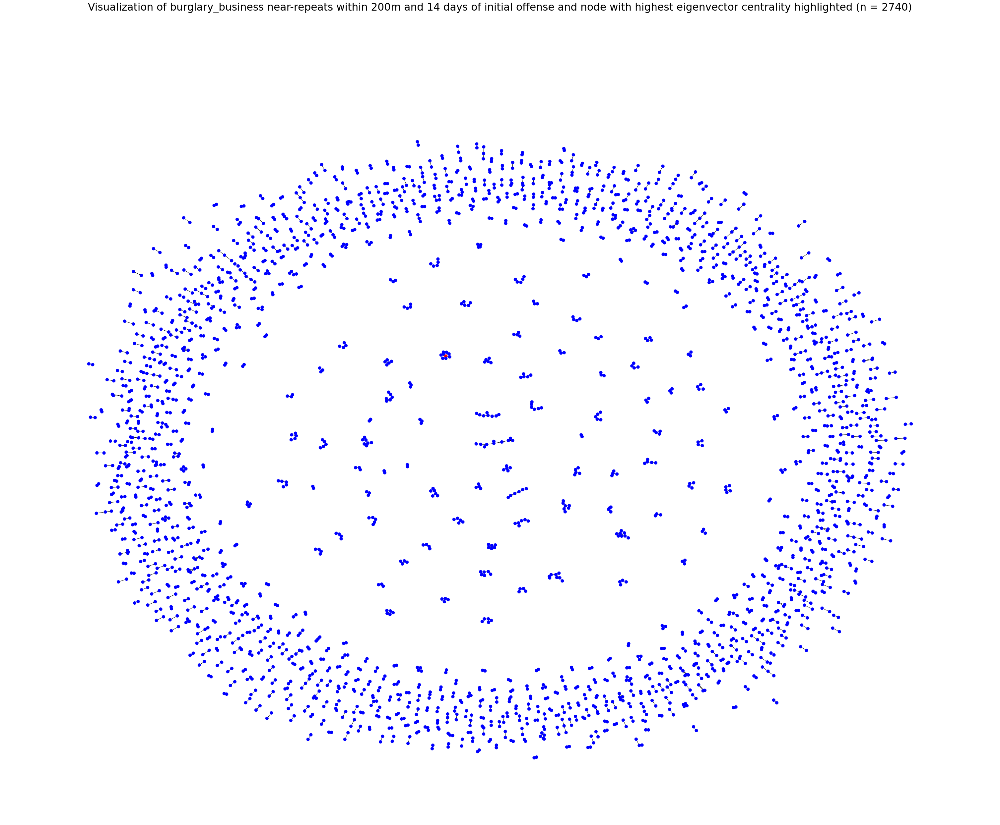

In [153]:
cm = []
G_test = dict_graph[f'burglary_business_14d_200m']
fig = plt.figure(1, figsize=(figsize_width, figsize_height), dpi=75)

for n in G_test.nodes():
    if n == xyz:
        cm.append('red')
    else:
        cm.append('blue')
        
nx.draw(G_test, with_labels=label, node_size=nodesize, width=width, node_color=cm)
fig.suptitle((f'Visualization of burglary_business near-repeats within 200m and 14 days of initial offense and node with highest eigenvector centrality highlighted (n = {G_test.number_of_nodes()})'), fontsize=30, y=1.1, ha="center")

# nx.draw(G_test.subgraph(xyz), node_size=nodesize, node_color=cm)
plt.show()

In [94]:
nx.closeness_centrality(G_test)

{20168722: 0.0021470746108427268,
 20168963: 0.00322061191626409,
 201612527: 0.0021470746108427268,
 201635815: 0.001610305958132045,
 201640513: 0.001610305958132045,
 201657161: 0.001610305958132045,
 2016129309: 0.001610305958132045,
 201662949: 0.001610305958132045,
 201643576: 0.001610305958132045,
 201682574: 0.001610305958132045,
 201676561: 0.001610305958132045,
 201693023: 0.001610305958132045,
 201675347: 0.001610305958132045,
 2016103508: 0.001610305958132045,
 2016103967: 0.001610305958132045,
 2016116784: 0.001610305958132045,
 2016115918: 0.001610305958132045,
 2016127094: 0.001610305958132045,
 2016164127: 0.001610305958132045,
 2016201667: 0.0051529790660225444,
 2016121995: 0.0042941492216854536,
 2016192032: 0.0028627661477903022,
 2016259485: 0.00322061191626409,
 2016755493: 0.0021470746108427268,
 2016184508: 0.00322061191626409,
 2016166839: 0.00322061191626409,
 2016206025: 0.0021470746108427268,
 2016171046: 0.001610305958132045,
 2016166414: 0.0016103059581320

In [95]:
nx.betweenness_centrality(G_test)

{20168722: 0.0,
 20168963: 5.194535348813049e-06,
 201612527: 0.0,
 201635815: 0.0,
 201640513: 0.0,
 201657161: 0.0,
 2016129309: 0.0,
 201662949: 0.0,
 201643576: 0.0,
 201682574: 0.0,
 201676561: 0.0,
 201693023: 0.0,
 201675347: 0.0,
 2016103508: 0.0,
 2016103967: 0.0,
 2016116784: 0.0,
 2016115918: 0.0,
 2016127094: 0.0,
 2016164127: 0.0,
 2016201667: 2.5972676744065244e-05,
 2016121995: 1.5583606046439148e-05,
 2016192032: 0.0,
 2016259485: 0.0,
 2016755493: 0.0,
 2016184508: 5.194535348813049e-06,
 2016166839: 0.0,
 2016206025: 0.0,
 2016171046: 0.0,
 2016166414: 0.0,
 2016187651: 0.0,
 2016160986: 0.0,
 2016209062: 0.0,
 2016195020: 5.194535348813049e-06,
 2016207678: 0.0,
 2016239616: 0.0,
 2016239784: 0.0,
 2016321582: 0.0,
 2016288973: 0.0,
 2016370164: 0.0,
 2016373101: 0.0,
 2016386928: 0.0,
 2016358358: 0.0,
 2016391465: 0.0,
 2016372216: 0.0,
 2016426082: 0.0,
 2016408603: 0.0,
 2016466828: 0.0,
 2016457931: 0.0,
 2016501289: 0.0,
 2016469231: 0.0,
 2016508746: 0.0,
 201

In [96]:
nx.clustering(G_test)

{20168722: 0,
 20168963: 0,
 201612527: 0,
 201635815: 0,
 201640513: 0,
 201657161: 0,
 2016129309: 0,
 201662949: 0,
 201643576: 0,
 201682574: 0,
 201676561: 0,
 201693023: 0,
 201675347: 0,
 2016103508: 0,
 2016103967: 0,
 2016116784: 0,
 2016115918: 0,
 2016127094: 0,
 2016164127: 0,
 2016201667: 0,
 2016121995: 0,
 2016192032: 0,
 2016259485: 0,
 2016755493: 0,
 2016184508: 0,
 2016166839: 0,
 2016206025: 0,
 2016171046: 0,
 2016166414: 0,
 2016187651: 0,
 2016160986: 0,
 2016209062: 0,
 2016195020: 0,
 2016207678: 0,
 2016239616: 0,
 2016239784: 0,
 2016321582: 0,
 2016288973: 0,
 2016370164: 0,
 2016373101: 0,
 2016386928: 0,
 2016358358: 0,
 2016391465: 0,
 2016372216: 0,
 2016426082: 0,
 2016408603: 0,
 2016466828: 0,
 2016457931: 0,
 2016501289: 0,
 2016469231: 0,
 2016508746: 0,
 2016477366: 0,
 2016518176: 0,
 2016494826: 0,
 2016520005: 0,
 2016517202: 0,
 2016534969: 0,
 2016547342: 0,
 2016524842: 0,
 2016495157: 0,
 2016528032: 0,
 2016505830: 0,
 2016539839: 0,
 20165

In [97]:
nx.degree_assortativity_coefficient(G_test)

-0.10061059275521402